<h1 align=center></h1>
<h1 align=center>Collapsed and Non-collapsed Building Classification</h1>
<h3 align=center>VGG-16</h3>

<br>

<p align="center">
    <img src="https://raw.githubusercontent.com/geoaihub/geoaihub/main/assets/Mersin%20GeoAI%20Hub%203.png" height=300 width=2000 alt="GitHub">
</p>

<small>Picture Source: <a href="https://github.com/geoaihub">GeoAI Hub Mersin</a></small>

<br>

<h2>Abstract</h2>

<p>This research presents an automated approach for detecting and classifying collapsed buildings in high-resolution satellite images, particularly in the aftermath of the Hatay earthquake, utilizing Maxar high-resolution satellite imagery. Advanced deep learning models, including ResNet-50, ResNet-50V2, ResNet-101, VGG-16, VGG-19, DenseNet169, DenseNet121 and MobileNetv2 are employed to identify "collapsed" and "non-collapsed" building classes.</p>

<br>

<h2>Context</h2>

<p>Computer Vision is an interdisciplinary field of study that focuses on enabling computers to interpret and understand visual information from the world around us. It involves the use of various techniques, including <i>image processing</i>, <i>pattern recognition</i>, and <i>machine learning</i>, to analyze and interpret <i>digital images</i> and <i>videos</i>. This project specifically focused on the use of <i>deep learning</i>, which is a subfield of <i>machine learning</i> that involves the use of <i>neural networks</i> to model complex relationships between input and output data.</p>

<br>

<p>By applying this knowledge and utilizing the <i>VGG-16 model</i>, you were able to develop a <i>high-performing image classification model</i> for collapsed buildings. This project showcases the practical application of <i>computer vision</i> and <i>deep learning techniques</i> in solving <i>real-world problems</i>, and <i>highlights</i> the importance of these techniques in the field of <i>computer engineering</i>.</p>

<br>

<h2>Objective</h2>

<p>The objective of this project is to develop a deep learning model using the <i>VGG-16</i> architecture to classify images of <i>collapsed building</i> and <i>non-collapsed building</i> with <i>high accuracy</i>. The model will be trained on a dataset of labeled images and evaluated. The ultimate goal is to create a model that can accurately distinguish between images of <i>collapsed building</i> and <i>non-collapsed building</i> in real-world scenarios.</p>

<br>

<h2>Keywords</h2>
<ul>
  <li>Satellite Imagery</li>
  <li>Convolutional Neural Networks</li>
  <li>VGG-16</li>
  <li>Earthquake</li>
  <li>Classification</li>
</ul>

<br>

<h2>Table of Contents</h2>

<div class="alert alert-block alert-info" style="margin-top: 20px">
<li><a href="https://#appropriate_environment">Create the Appropriate Environment</a></li>
<li><a href="https://#libraries">Import Libraries and Packages</a></li>
<li><a href="https://#data_preparation">Dataset Preparation</a></li>
<li><a href="https://#compile_fit">Compile VGG-16 Model</a></li>
<li><a href="https://#train_model">Train the VGG16 Model</a></li>
<li><a href="https://#evaluate_model">Evaluate the VGG16 Model</a></li>
<li><a href="https://#upload_pred">Upload and Predict Your Picture!</a></li>

<br>

<p></p>
Estimated Time Needed: <strong>20 min</strong>
</div>

<br>

<h2 align=center id="appropriate_environment">Create the Appropriate Environment</h2>

<p>After downloading the dataset, we can create the appropriate environment for the data and we can unzip the file.</p>

In [ ]:
!unzip -q /content/dataset.zip

In [ ]:
!ls

assets	       fingerprint.pb	  sample_data	  train		variables
best_model.h5  keras_metadata.pb  saved_model.pb  training.csv
dataset.zip    model_vgg16.png	  test		  valid


<p>You may want to remove zip file which contains our dataset.</p>

In [ ]:
# !rm -rf /content/dataset.zip

<br>

<h2 align=center id="libraries">Import Libraries and Packages</h2>

<p>Before we proceed, let's import the libraries and packages that we will need to complete the rest of this lab.</p>

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import numpy as np
import seaborn as sns

import os

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import TensorBoard, CSVLogger, ModelCheckpoint

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, GlobalAveragePooling2D
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.utils import load_img, img_to_array

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc

import warnings
warnings.filterwarnings("ignore")

In [ ]:
tf.__version__

'2.12.0'

<br>

<h2 align=center id="data_preparation">Dataset Preparation</h2>

<br>
<h3>Define Parameters</h3>

In [ ]:
#@markdown ---
#@markdown ### Enter number of classes:
num_classes = 2 #@param {type:"integer"}

image_resize = (224, 224)

#@markdown

#@markdown ### Enter number of epochs:
num_epochs = 64 #@param {type:"integer"}

#@markdown

#@markdown ### Enter batch sizes:
batch_size_training = 8 #@param {type:"integer"}
batch_size_validation = 4 #@param {type:"integer"}
batch_size_test = 2 #@param {type:"integer"}

#@markdown

#@markdown ### Enter director paths:
train_path = '/content/train' #@param {type:"string"}
valid_path = '/content/valid' #@param {type:"string"}
test_path = '/content/test' #@param {type:"string"}
#@markdown ---

In [ ]:
datagen = ImageDataGenerator(rescale=1./255)

<br>
<h3>Prepare Train Class</h3>

In [ ]:
train_generator = datagen.flow_from_directory(
    train_path,
    target_size=image_resize,
    batch_size=batch_size_training,
    class_mode = 'categorical',
)

Found 400 images belonging to 2 classes.


In [ ]:
print('Class indices:', train_generator.class_indices)
print('Number of train samples:', train_generator.samples)
print('First and last 5 filenames:', train_generator.filenames[0:5], train_generator.filenames[-5:])
# print('Train classes: ', train_generator.classes)

Class indices: {'collapsed': 0, 'non_collapsed': 1}
Number of train samples: 400
First and last 5 filenames: ['collapsed/img_1.png', 'collapsed/img_112.png', 'collapsed/img_119.png', 'collapsed/img_127.png', 'collapsed/img_134.png'] ['non_collapsed/img_888.png', 'non_collapsed/img_890.png', 'non_collapsed/img_892.png', 'non_collapsed/img_895.png', 'non_collapsed/img_898.png']


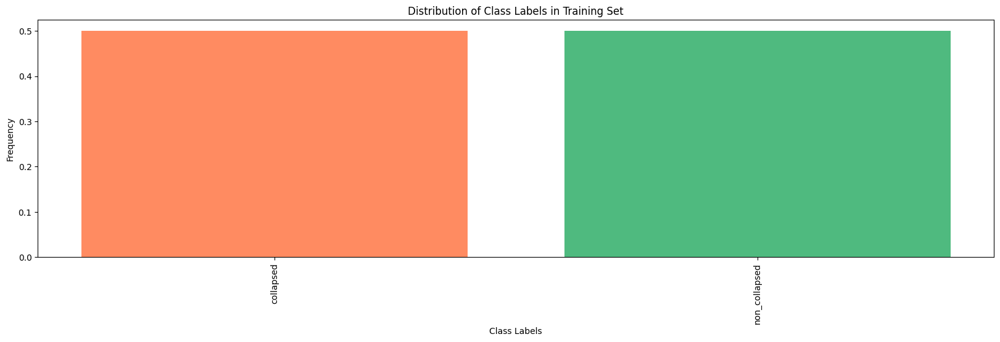

In [ ]:
labels = list(train_generator.class_indices.keys())
freqs = np.mean(train_generator.labels, axis=0)

fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(labels, freqs, color=['coral', 'mediumseagreen'], alpha=0.9)
ax.set_xlabel('Class Labels')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Class Labels in Training Set')
plt.xticks(rotation=90)
plt.show()

<p>A balanced dataset is a dataset in which all classes or categories have approximately the same number of samples. This means that no class is overrepresented or underrepresented in the dataset. In other words, a balanced dataset has a uniform distribution of samples across all classes.</p>

<p>Having a balanced dataset is important for training machine learning models because it ensures that the model is exposed to an equal number of examples from all classes.</p>

In [ ]:
labels = train_generator.classes
unique_labels, label_counts = np.unique(labels, return_counts=True)

print("Number of unique labels:", len(unique_labels))
for label, count in zip(unique_labels, label_counts):
    print("Label:", label, "- Count:", count)

Number of unique labels: 2
Label: 0 - Count: 200
Label: 1 - Count: 200


<br>
<h4>Dive Into Batches</h4>

<p>The batch size refers to the number of samples that will be processed by the model in each training iteration. For example, if the batch size is set to 32, then the model will process 32 samples at a time during each iteration. Larger batch sizes can lead to faster training times, but can also require more memory and may be less accurate. Smaller batch sizes can be slower, but may result in better generalization and less overfitting.</p>

In [ ]:
first_batch = train_generator.next()

In [ ]:
first_batch[1]

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.]], dtype=float32)

In [ ]:
train_generator.class_indices

{'collapsed': 0, 'non_collapsed': 1}

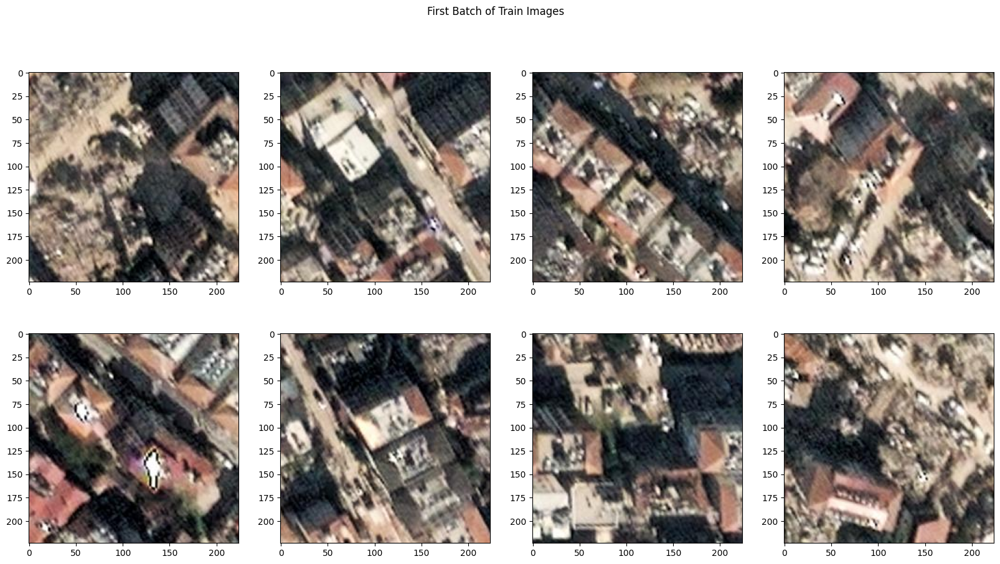

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

ind = 0
for ax1 in axs:
    for ax2 in ax1:
        image_data = first_batch[0][ind]
        ax2.imshow(image_data)
        ind += 1

fig.suptitle('First Batch of Train Images')
plt.show()

<br>
<h3>Prepare Validation Class</h3>

In [ ]:
validation_generator = datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=batch_size_validation,
    class_mode = 'categorical',
)

Found 180 images belonging to 2 classes.


In [ ]:
print('Class indices:', validation_generator.class_indices)
print('Number of validation samples:', validation_generator.samples)
print('First and last 5 filenames:', validation_generator.filenames[0:5], validation_generator.filenames[-5:])
# print('Validation classes: ', validation_generator.classes)

Class indices: {'collapsed': 0, 'non_collapsed': 1}
Number of validation samples: 180
First and last 5 filenames: ['collapsed/img_104.png', 'collapsed/img_109.png', 'collapsed/img_119.png', 'collapsed/img_120.png', 'collapsed/img_123.png'] ['non_collapsed/img_90.png', 'non_collapsed/img_91.png', 'non_collapsed/img_97.png', 'non_collapsed/img_98.png', 'non_collapsed/img_99.png']


<br>

<p>The "Distribution of Class Labels in Training Set" plot shows the distribution of samples across the different classes or categories in the <i>training set</i>. The <i>x-axis</i> represents the different classes, and the y-axis represents the frequency or number of <i>samples</i> in each <i>class</i>. Each <i>bar</i> in the plot represents a class, and its height corresponds to the number of samples in that class.</p>

<br>

<p>By <i>examining</i> this <i>plot</i>, you can get a sense of how <i>balanced</i> or <i>imbalanced</i> your <i>dataset</i> is. If the height of the bars is roughly the same for all classes, then your <i>dataset</i> is considered to be balanced. If some bars are much taller than others, then your dataset is considered to be <i>imbalanced</i>, with some <i>classes</i> having more samples than others.</p>

<br>

<p>This plot is helpful for understanding the underlying distribution of your dataset and identifying any potential <i>imbalances</i> that may affect your model's performance. <b>If your <i>dataset</i> is <i>imbalanced</i>, you may need to consider using techniques such as <i>oversampling</i> or <i>undersampling</i> to create a more balanced dataset</b>.</p>

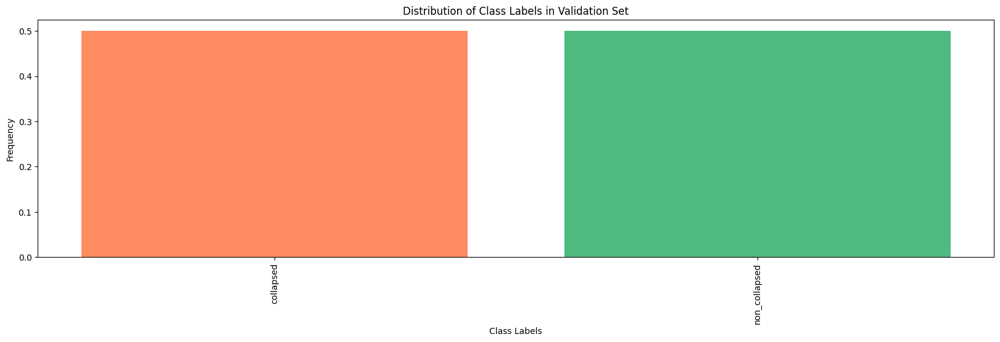

In [ ]:
labels = list(train_generator.class_indices.keys())
freqs = np.mean(train_generator.labels, axis=0)

fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(labels, freqs, color=['coral', 'mediumseagreen'], alpha=0.9)
ax.set_xlabel('Class Labels')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Class Labels in Validation Set')
plt.xticks(rotation=90)
plt.show()

In [ ]:
labels = validation_generator.classes
unique_labels, label_counts = np.unique(labels, return_counts=True)

print("Number of unique labels:", len(unique_labels))
for label, count in zip(unique_labels, label_counts):
    print("Label:", label, "- Count:", count)

Number of unique labels: 2
Label: 0 - Count: 90
Label: 1 - Count: 90


<p>Having a <i>balanced dataset</i> is important for training <i>machine learning models</i> because it ensures that the model is exposed to an equal number of examples from all classes. This is particularly important in <i>classification problems</i>, where the goal is to <i>predict</i> the correct <i>class label</i> for a given input sample. If a <i>dataset</i> is imbalanced, where some classes have much fewer examples than others, the <i>model</i> may learn to be <i>biased</i> towards the <i>majority class</i> and perform poorly on the <i>minority classes</i>.</p>

<p><i>Balancing</i> a <i>dataset</i> can be achieved through various techniques, such as <b><i>oversampling the minority classes</i>, <i>undersampling the majority classes</i>, or using a <i>combination</i> of both</b>. These techniques aim to <i>adjust</i> the number of samples in each class to create a more <i>balanced dataset</i>.</p>

<br>
<h4>Dive Into Batches</h4>

<p>The <i>batch</i> size determines the number of <i>samples</i> processed in each <i>iteration</i>.</p>

In [ ]:
first_batch = validation_generator.next()

In [ ]:
first_batch[1]

array([[0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.]], dtype=float32)

In [ ]:
validation_generator.class_indices

{'collapsed': 0, 'non_collapsed': 1}

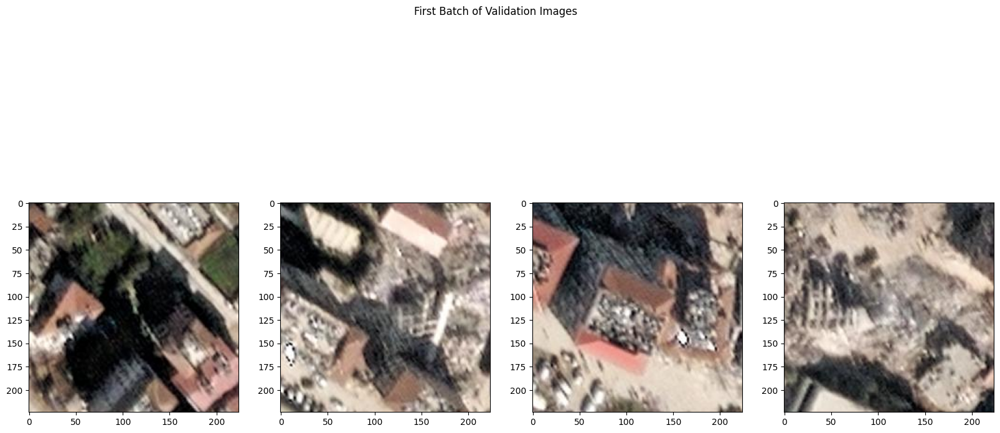

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 10))

ind = 0
for ax1 in axs:
    image_data = first_batch[0][ind]
    ax1.imshow(image_data)
    ind += 1

fig.suptitle('First Batch of Validation Images')
plt.show()

<br>

<h2 align=center id="compile_fit">Compile VGG-16 Model</h2>

<p><i>VGG-16</i> is a <i>convolution neural net (CNN)</i> architecture which was used to win <i>ILSVR (Imagenet)</i> competition in 2014. It is considered to be one of the excellent <i>vision model architecture</i> till date. In this section, we will start building our model. We will use the <i>Sequential model class</i> from <i>Keras</i>.</p></p>

<br>
<h3>Build VGG-16 Model</h3>

In [ ]:
model_vgg16 = Sequential()

<p>Then, we will define our output layer as a <b>Dense</b> layer.</p>

In [ ]:
model_vgg16.add(VGG16(include_top=False, pooling="avg", weights="imagenet"))
model_vgg16.add(Dense(64, activation='softmax', name = 'dense'))
model_vgg16.add(Dense(num_classes, activation="softmax", name = 'output'))

In [ ]:
model_vgg16.layers[0].trainable = False

<p>You can access the model's layers using the <i>layers</i> attribute of our model object.</p>

In [ ]:
model_vgg16.layers

<p>And now using the <i>summary</i> attribute of the model.</p>

In [ ]:
model_vgg16.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 dense (Dense)               (None, 64)                32832     
                                                                 
 output (Dense)              (None, 2)                 130       
                                                                 
Total params: 14,747,650
Trainable params: 32,962
Non-trainable params: 14,714,688
_________________________________________________________________


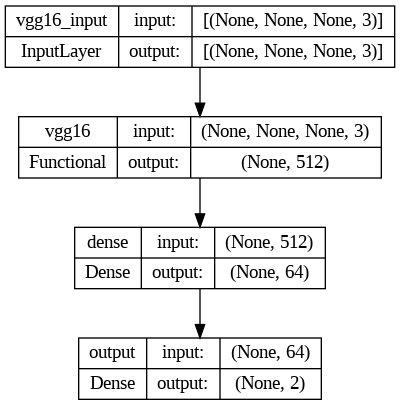

In [ ]:
plot_model(model_vgg16, to_file='model_vgg16.png', show_shapes=True, show_layer_names=True)

<br>
<h3>Compile the Model</h3>

<p>Next, we compile our model using the <b>adam</b> optimizer.</p>

In [ ]:
model_vgg16.compile(optimizer="adam", loss="categorical_crossentropy",
                    metrics=["accuracy", tf.keras.metrics.Precision(),
                             tf.keras.metrics.Recall(),
                             tf.keras.metrics.TruePositives(),
                             tf.keras.metrics.TrueNegatives(),
                             tf.keras.metrics.FalsePositives(),
                             tf.keras.metrics.FalseNegatives()])

<br>

<h2 align=center id="train_model">Train the VGG16 Model</h2>

<br>
<h3>Define Callback</h3>

<a name="4-1-1"></a>
#### [TensorBoard](https://www.tensorflow.org/tensorboard?hl=tr)

TensorBoard is a tool for providing the measurements and visualizations needed during the machine learning workflow. It enables tracking experiment metrics like loss and accuracy, visualizing the model graph, projecting embeddings to a lower dimensional space, and much more.

<br>

<a name="4-1-2"></a>
#### [CSVLogger](https://keras.io/api/callbacks/csv_logger/)

Callback that streams epoch results to a CSV file.

<br>

<a name="4-1-3"></a>
#### [ModelCheckpoint](https://keras.io/api/callbacks/model_checkpoint/)

ModelCheckpoint callback is used in conjunction with training using <code>model.fit()</code> to save a model or weights (in a checkpoint file) at some interval, so the model or weights can be loaded later to continue the training from the state saved.

In [ ]:
get_ipython().system('rm -rf logs')

In [ ]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir)

In [ ]:
csv_file = 'training.csv'

In [ ]:
callbacks_list = [tensorboard_callback, CSVLogger(csv_file), ModelCheckpoint('/content/' + 'best_model.h5', verbose=1)]

<br>
<h3>Fit the Model</h3>

In [ ]:
import time
start = time.time()

history = model_vgg16.fit(train_generator,
                    epochs=num_epochs,
                    validation_data=validation_generator,
                    callbacks=[callbacks_list])

end = time.time()

elapsed_time = end - start

print(f"\nElapsed Time:{elapsed_time}s")

Epoch 1/64
50/50 [==============================] - ETA: 0s - loss: 0.6784 - accuracy: 0.6550 - precision: 0.6550 - recall: 0.6550 - true_positives: 262.0000 - true_negatives: 262.0000 - false_positives: 138.0000 - false_negatives: 138.0000
Epoch 1: saving model to /content/best_model.h5
50/50 [==============================] - 11s 120ms/step - loss: 0.6784 - accuracy: 0.6550 - precision: 0.6550 - recall: 0.6550 - true_positives: 262.0000 - true_negatives: 262.0000 - false_positives: 138.0000 - false_negatives: 138.0000 - val_loss: 0.6511 - val_accuracy: 0.9111 - val_precision: 0.9111 - val_recall: 0.9111 - val_true_positives: 164.0000 - val_true_negatives: 164.0000 - val_false_positives: 16.0000 - val_false_negatives: 16.0000
Epoch 2/64
49/50 [============================>.] - ETA: 0s - loss: 0.6197 - accuracy: 0.8776 - precision: 0.8776 - recall: 0.8776 - true_positives: 344.0000 - true_negatives: 344.0000 - false_positives: 48.0000 - false_negatives: 48.0000
Epoch 2: saving model to

<br>
<h3>Save the Model</h3>

In [ ]:
%cd /content/

/content


In [ ]:
model_vgg16.save('/content/')

<br>

<h2 align=center id="evaluate_model">Evaluate the VGG16 Model</h2>

<p>Evaluating a CNN model is a crucial step in the development of a deep learning project. It helps in understanding how well the model performs on unseen data and provides insights into whether the model is overfitting or underfitting. Evaluation of the CNN model is important for the following reasons:</p>

<br>

<ol>
  <li><b>Performance measurement:</b> Evaluating a model helps in measuring its performance on the test data. This gives an idea of how well the model has learned to generalize to new data.</li>

  <li><b>Model selection:</b> Evaluation of different models can help in selecting the best model among them. It is essential to choose the model with the best performance metrics to deploy it in a production environment.</li>

  <li><b>Hyperparameter tuning:</b> Evaluating a model can also help in fine-tuning the hyperparameters of the model. By comparing the performance of models with different hyperparameters, we can identify the optimal hyperparameters that produce the best performance.</li>

  <li><b>Debugging:</b> Evaluation helps in identifying and diagnosing issues in the model. It can help in determining whether the model is overfitting or underfitting, which can be addressed by adjusting the architecture or hyperparameters.</li>
</ol>

<br>
<h3>Evaluate the Model with TensorBoard</h3>

In [ ]:
%load_ext tensorboard

In [ ]:
get_ipython().run_line_magic('tensorboard', '--logdir logs')

<IPython.core.display.Javascript object>

In [ ]:
# from tensorflow.keras.models import load_model
# model = load_model('/content/best_model.h5')

<br>
<h3>Calculate Model Loss and Accuracy</h3>

<p>Evaluate the model on the test set.</p>

In [ ]:
test_generator = datagen.flow_from_directory(
  test_path,
  target_size=image_resize,
  batch_size=batch_size_test,
  class_mode='categorical',
  shuffle=False,
)

Found 120 images belonging to 2 classes.


In [ ]:
test_loss, test_acc, precision, recall, true_positives, true_negatives, false_positives, false_negatives = model_vgg16.evaluate(test_generator)
print('\nloss ', test_loss, '\ntest accuracy ', test_acc, '\nprecision', precision, '\nrecall', recall, '\ntrue_positives', true_positives, '\ntrue_negatives', true_negatives, '\nfalse_positives', false_positives, '\nfalse_negatives', false_negatives)

60/60 [==============================] - 2s 17ms/step - loss: 0.3453 - accuracy: 0.8750 - precision: 0.8750 - recall: 0.8750 - true_positives: 105.0000 - true_negatives: 105.0000 - false_positives: 15.0000 - false_negatives: 15.0000

loss  0.3452928960323334 
test accuracy  0.875 
precision 0.875 
recall 0.875 
true_positives 105.0 
true_negatives 105.0 
false_positives 15.0 
false_negatives 15.0


<br>
<h3>Predict Test Images and Show Them on DataFrame</h3>

In [ ]:
filenames=test_generator.filenames
pred=model_vgg16.predict_generator(test_generator, steps=len(test_generator), verbose=1).round(3)

60/60 [==============================] - 1s 16ms/step


In [ ]:
filenames_df = pd.DataFrame(filenames, columns=['File Path'])
pred_df = pd.DataFrame(pred, columns=['collapsed_accuracy', 'non-collapsed_accuracy'])
model_predictions = pd.concat([filenames_df, pred_df], axis=1)
model_predictions

,File Path,collapsed_accuracy,non-collapsed_accuracy
0,collapsed/img_101.png,0.985,0.015
1,collapsed/img_107.png,0.984,0.016
2,collapsed/img_108.png,0.984,0.016
3,collapsed/img_11.png,0.984,0.016
4,collapsed/img_111.png,0.984,0.016
...,...,...,...
115,non_collapsed/img_89.png,0.030,0.970
116,non_collapsed/img_90.png,0.017,0.983
117,non_collapsed/img_94.png,0.792,0.208
118,non_collapsed/img_95.png,0.376,0.624


In [ ]:
file_name='model_predictions.csv'
model_predictions.to_csv(file_name, sep=',', encoding='utf-8')

<br>
<h3>Confusion Matrix</h4>

<p>Get the predicted labels for the test set.</p>

In [ ]:
y_pred = model_vgg16.predict(test_generator)

60/60 [==============================] - 1s 16ms/step


In [ ]:
y_scores = y_pred

In [ ]:
y_pred = np.round(y_pred)

In [ ]:
y_pred = np.argmax(y_pred, axis=1)

<p>Get the true labels for the test set.</p>

In [ ]:
y_true = test_generator.classes

In [ ]:
y_true

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [ ]:
cm = confusion_matrix(y_true, y_pred)

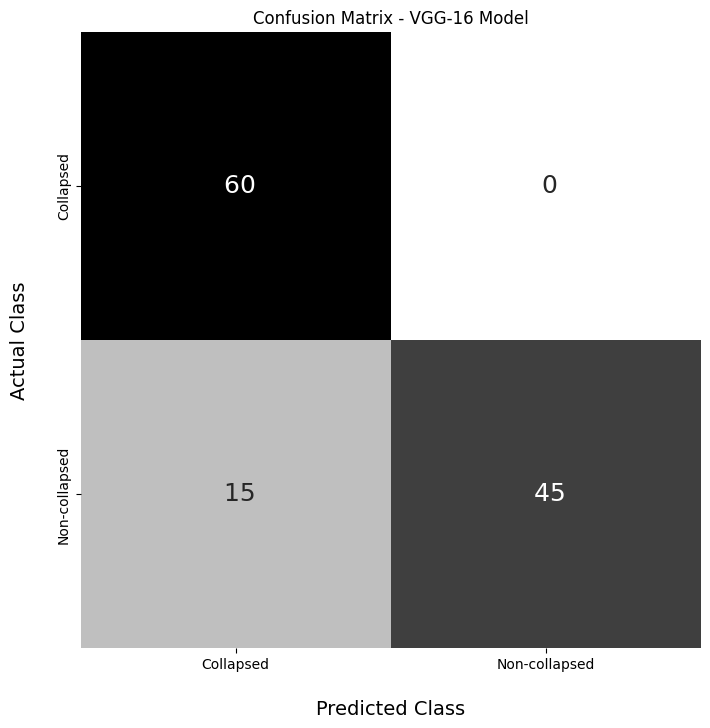

In [ ]:
sns.axes_style('white')
df_cm_vgg16 = pd.DataFrame(cm, index = [i for i in ["Collapsed", "Non-collapsed"]],
                  columns = [i for i in ["Collapsed", "Non-collapsed"]])

plt.figure(figsize=(8, 8), dpi=100)

plt.title('Confusion Matrix - VGG-16 Model')
sns.heatmap(df_cm_vgg16, annot=True, annot_kws={"size": 18}, fmt=' ', cmap='binary', cbar=False)
plt.ylabel('Actual Class', size=14, labelpad=20)
plt.xlabel('Predicted Class', size=14, labelpad=20)
plt.show()

<br>
<h3>Compute the Classification Report</h3>

In [ ]:
cr = classification_report(y_true, y_pred, target_names=validation_generator.class_indices.keys())

In [ ]:
print("Classification Report:")
print(cr)

Classification Report:
               precision    recall  f1-score   support

    collapsed       0.80      1.00      0.89        60
non_collapsed       1.00      0.75      0.86        60

     accuracy                           0.88       120
    macro avg       0.90      0.88      0.87       120
 weighted avg       0.90      0.88      0.87       120



<br>
<h3>Receiver Operating Characteristic (ROC) and the Area Under the Curve (AUC)</h3>

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = y_scores.shape[1]
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true == i, y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

In [ ]:
plt.figure(figsize=(8, 6), dpi=150)
colors = ['orange', 'green']
class_labels = ['collapsed', 'non-collapsed']  # Update class labels here
n_classes = len(colors)

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve of class {0} (AUC = {1:0.4f})'
             ''.format(class_labels[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.03])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (VGG-16 Model)')
plt.legend(loc="lower right")
plt.show()

<br>

<h2 align=center id="upload_pred">Upload and Predict Your Picture!</h2>

<p>You can upload any image and have the model predict whether it's a collapsed building or non-collapsed building.</p>
<ul>
  <li>Find an image.</li>
  <li>Run the following code cell. It will ask you to upload an image.</li>
  <!-- <li>The model will print "is a dog" or "is a cat" depending on the model's prediction.</li> -->
<ul>

In [ ]:
%cd /content/

/content


In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():

  path = '/content/' + fn
  img = load_img(path, target_size=image_resize)
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)

  image_tensor = np.vstack([x])
  classes = model_vgg16.predict(image_tensor)
  y_pred = np.round(classes)
  y_pred = np.argmax(y_pred, axis=1)
  print(y_pred)
  print(classes[0])
  if y_pred == 0:
    print(fn + " picture classified as a collapsed building.")
  elif y_pred == 1:
    print(fn + " picture classified as a non-collapsed building.")

Saving img_800.png to img_800.png
1/1 [==============================] - 1s 761ms/step
[1]
[0.0171653 0.9828347]
img_800.png picture classified as a non-collapsed building.


In [ ]:
from google.colab import files
files.download('/content/variables/variables.data-00000-of-00001')
files.download('/content/variables/variables.index')
files.download('/content/best_model.h5')
files.download('/content/fingerprint.pb')
files.download('/content/keras_metadata.pb')
files.download('/content/saved_model.pb')
files.download('/content/training.csv')
files.download('/content/model_predictions.csv')
files.download('/content/model_vgg16.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<h1>Contact</h1>
<p>If you have something to say to us, please contact with us:</p>

<ul>
  <li>Mail address: <a href="mailto:geoaihub@gmail.com">geoaihub@gmail.com</a></li>
</ul>

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2023-07-28 12:28:40
